### 4 Datasets for this task 
    - CACD : 154K imgs
    - Morph : 50k imgs
    - Agedb : 16K imgs
    - Fgnet : 1k imgs

In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("nitingandhi/agedb-database")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/agedb-database


In [2]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("pdombrza/cacd-filtered-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/cacd-filtered-dataset


In [3]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("aiolapo/fgnet-dataset")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/fgnet-dataset


In [4]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("chiragsaipanuganti/morph")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/morph


In [5]:
!apt-get install -y -q tree

Reading package lists...
Building dependency tree...
Reading state information...
The following NEW packages will be installed:
  tree
0 upgraded, 1 newly installed, 0 to remove and 98 not upgraded.
Need to get 47.9 kB of archives.
After this operation, 116 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tree amd64 2.0.2-1 [47.9 kB]
Fetched 47.9 kB in 1s (68.4 kB/s)
Selecting previously unselected package tree.
(Reading database ... 129073 files and directories currently installed.)
Preparing to unpack .../tree_2.0.2-1_amd64.deb ...
Unpacking tree (2.0.2-1) ...
Setting up tree (2.0.2-1) ...
Processing triggers for man-db (2.10.2-1) ...


# FGNET

In [6]:
!tree -L 2 /kaggle/input/fgnet-dataset

/kaggle/input/fgnet-dataset
└── FGNET
    ├── Data_files
    ├── images
    └── points

4 directories, 0 files


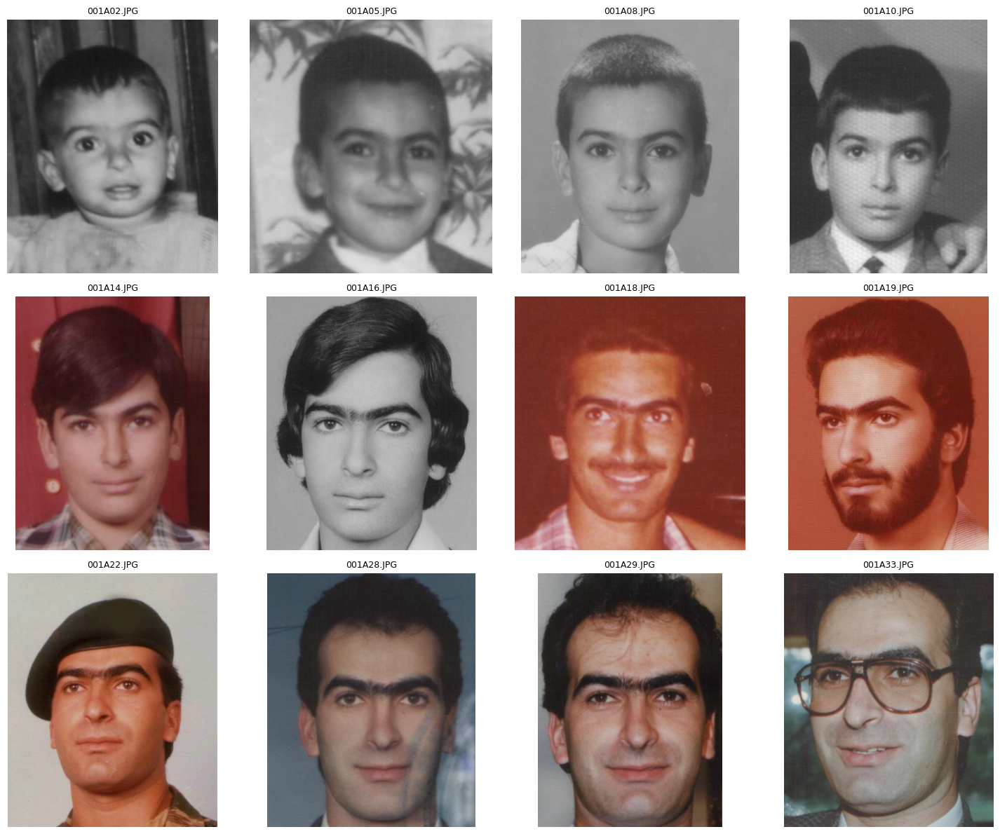

In [7]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to your FGNET images
img_dir = "/kaggle/input/fgnet-dataset/FGNET/images"

# Number of first images to plot
n = 12

# Get all image file names and SORT them
all_images = sorted([f for f in os.listdir(img_dir) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Select the FIRST n images
selected_images = all_images[:n]

# Plot images
cols = 4  # number of columns
rows = (n + cols - 1) // cols  # number of rows

plt.figure(figsize=(15, 4 * rows))

for i, img_name in enumerate(selected_images):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path).convert("RGB")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(img_name, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [8]:
import os
import re
import pandas as pd

# FG-NET images path
IMG_DIR = "/kaggle/input/fgnet-dataset/FGNET/images"
OUTPUT_PATH = "/kaggle/working/fgnet.csv"

# Regex: 001A14.JPG, 001A43a.JPG, 001A43b.JPG
pattern = re.compile(r'^(?P<identity>\d+)A(?P<age>\d+)', re.IGNORECASE)

records = []

for filename in sorted(os.listdir(IMG_DIR)):
    if filename.lower().endswith((".jpg", ".jpeg", ".png")):
        filepath = os.path.join(IMG_DIR, filename)

        name_no_ext = filename.split(".")[0]
        m = pattern.match(name_no_ext)

        if m:
            identity = m.group("identity")       # '001'
            age = int(m.group("age"))            # 14
        else:
            identity = "unknown"
            age = -1

        records.append({
            "identity": identity,
            "age": age,
            "gender": -1,        # FG-NET has no gender
            "filename": filename,
            "filepath": filepath
        })

# Create DataFrame
df = pd.DataFrame(records)

# Save CSV
df.to_csv(OUTPUT_PATH, index=False)

print(f"✅ FG-NET CSV saved to: {OUTPUT_PATH}")
df.tail(10)

✅ FG-NET CSV saved to: /kaggle/working/fgnet.csv


,identity,age,gender,filename,filepath
992,082,3,-1,082A03.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A0...
993,082,16,-1,082A16.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A1...
994,082,18,-1,082A18.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A1...
995,082,20,-1,082A20.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...
996,082,21,-1,082A21.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...
997,082,22,-1,082A22.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...
998,082,23,-1,082A23.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...
999,082,25,-1,082A25.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...
1000,082,27,-1,082A27.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...
1001,082,31,-1,082A31.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A3...


In [9]:
!pip install -q insightface onnxruntime
!pip install -q onnxruntime-gpu

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 439.5/439.5 kB 11.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.4/17.4 MB 109.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 5.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.5/300.5 MB 6.3 MB/s eta 0:00:00


In [10]:
import cv2
import numpy as np
import os
import pandas as pd
from tqdm import tqdm
import insightface
from insightface.app import FaceAnalysis
from concurrent.futures import ThreadPoolExecutor
import traceback
from skimage import transform as trans

# ============================================================
# FG-NET FACE ALIGNMENT - TIGHT FACE CROPS (OPTIMIZED)
# ============================================================

# Paths
input_csv_path = "/kaggle/working/fgnet.csv"
output_dir = "/kaggle/working/FGNET_processed"
output_csv_path = "/kaggle/working/FGNET_processed.csv"
log_path = "/kaggle/working/processing_log.txt"
failed_images_dir = "/kaggle/working/FGNET_failed_samples"

# Create output directories
os.makedirs(output_dir, exist_ok=True)
os.makedirs(failed_images_dir, exist_ok=True)

# Performance settings
NUM_WORKERS = 4
GPU_ID = 0

# Output parameters
OUTPUT_SIZE = (224, 224)  # Increased for better quality
DET_THRESHOLD = 0.15

# Initialize InsightFace
print("Loading InsightFace face detector...")
app = FaceAnalysis(
    allowed_modules=['detection', 'landmark_2d_106'],
    providers=['CUDAExecutionProvider', 'CPUExecutionProvider']
)
app.prepare(ctx_id=GPU_ID, det_size=(640, 640), det_thresh=DET_THRESHOLD)


def get_reference_facial_points(output_size=(112, 112), scale_factor=1.0):
    """
    Get reference facial landmarks scaled for different crop tightness
    scale_factor: 1.0 = standard, 1.2 = tighter crop (less background)
    """
    tmp_5pts = np.array([
        [30.2946, 51.6963],  # Left eye
        [65.5318, 51.5014],  # Right eye  
        [48.0252, 71.7366],  # Nose tip
        [33.5493, 92.3655],  # Left mouth corner
        [62.7299, 92.2041]   # Right mouth corner
    ], dtype=np.float32)
    
    # Scale to output size
    tmp_5pts[:, 0] *= (output_size[0] / 96.0)
    tmp_5pts[:, 1] *= (output_size[1] / 112.0)
    
    # Adjust for tighter crop by moving points toward center
    if scale_factor != 1.0:
        center = tmp_5pts.mean(axis=0)
        tmp_5pts = center + (tmp_5pts - center) * scale_factor
    
    return tmp_5pts


def estimate_norm(lmk, image_size=112, scale_factor=1.0):
    """
    Estimate similarity transformation from landmarks to reference points
    """
    assert lmk.shape == (5, 2)
    
    tform = trans.SimilarityTransform()
    
    # Get reference points with scaling
    src = get_reference_facial_points(
        output_size=(image_size, image_size),
        scale_factor=scale_factor
    )
    
    # Estimate transformation
    tform.estimate(lmk, src)
    M = tform.params[0:2, :]
    
    return M


def align_face_insightface(img, face, output_size=(224, 224), scale_factor=1.2):
    """
    Align face using similarity transformation
    scale_factor: 1.2 = tighter crop (recommended for training)
    """
    try:
        kps = face.kps
        
        if kps is None or len(kps) < 5:
            return None, "Insufficient landmarks", None
        
        # Use first 5 landmarks (eyes, nose, mouth corners)
        landmarks = kps[:5].astype(np.float32)
        
        # Estimate similarity transformation matrix
        M = estimate_norm(
            landmarks, 
            image_size=output_size[0],
            scale_factor=scale_factor
        )
        
        # Apply affine transformation
        aligned = cv2.warpAffine(
            img, 
            M, 
            output_size,
            borderValue=0.0,
            flags=cv2.INTER_CUBIC  # Better quality interpolation
        )
        
        if aligned.size == 0:
            return None, "Empty aligned result", None
        
        return aligned, None, {
            'bbox': face.bbox.tolist(),
            'det_score': float(face.det_score),
            'landmarks_used': 5
        }
        
    except Exception as e:
        return None, f"Alignment error: {str(e)}", None


def process_single_image(row):
    """Process a single image with detailed error handling"""
    image_path = row['filepath']
    image_name = os.path.basename(image_path)
    
    try:
        # Read image
        img = cv2.imread(image_path)
        if img is None:
            return {
                'image_name': image_name,
                'status': 'failed',
                'error': 'Failed to read image',
                'age': row.get('age', None)
            }
        
        # Detect faces
        faces = app.get(img)
        
        if len(faces) == 0:
            # Save failed image
            failed_path = os.path.join(failed_images_dir, image_name)
            cv2.imwrite(failed_path, img)
            
            return {
                'image_name': image_name,
                'status': 'failed',
                'error': 'No face detected',
                'age': row.get('age', None)
            }
        
        # Use face with highest detection score
        face = max(faces, key=lambda x: x.det_score)
        
        # Align face with tighter crop (scale_factor=1.2)
        aligned, error, debug_info = align_face_insightface(
            img, face, 
            output_size=OUTPUT_SIZE,
            scale_factor=1.2  # Adjust this: 1.0=standard, 1.2=tighter, 1.5=very tight
        )
        
        if aligned is None:
            failed_path = os.path.join(failed_images_dir, image_name)
            cv2.imwrite(failed_path, img)
            
            return {
                'image_name': image_name,
                'status': 'failed',
                'error': error,
                'age': row.get('age', None)
            }
        
        # Save aligned face
        output_path = os.path.join(output_dir, image_name)
        cv2.imwrite(output_path, aligned)
        
        return {
            'image_name': image_name,
            'status': 'success',
            'aligned_path': output_path,
            'original_path': image_path,
            'age': row.get('age', None),
            'identity': row.get('identity', None),
            'det_score': debug_info['det_score'],
            'bbox': debug_info['bbox']
        }
        
    except Exception as e:
        return {
            'image_name': image_name,
            'status': 'failed',
            'error': f"Exception: {str(e)}",
            'age': row.get('age', None)
        }


# ============================================================
# MAIN PROCESSING
# ============================================================

print("Loading FG-NET dataset CSV...")
df = pd.read_csv(input_csv_path)
print(f"Found {len(df)} images in CSV\n")

# Test first 5 images
print("=" * 70)
print("TESTING FIRST 5 IMAGES")
print("=" * 70)
for i in range(min(5, len(df))):
    row = df.iloc[i]
    img = cv2.imread(row['filepath'])
    if img is not None:
        faces = app.get(img)
        if len(faces) > 0:
            face = faces[0]
            print(f"✓ Image {i}: {os.path.basename(row['filepath'])}")
            print(f"  Age: {row.get('age', 'N/A')}, Identity: {row.get('identity', 'N/A')}")
            print(f"  Landmarks shape: {face.kps.shape if face.kps is not None else 'None'}")
            print(f"  Detection score: {face.det_score:.3f}")
print("=" * 70 + "\n")

# Process all images
print(f"Processing {len(df)} images with {NUM_WORKERS} workers...")
print(f"Output size: {OUTPUT_SIZE}, Scale factor: 1.2 (tighter crop)")
print(f"Detection threshold: {DET_THRESHOLD}\n")

with ThreadPoolExecutor(max_workers=NUM_WORKERS) as executor:
    results = list(tqdm(
        executor.map(process_single_image, [row for _, row in df.iterrows()]),
        total=len(df),
        desc="Processing"
    ))

# Save results
print("\nSaving results...")
results_df = pd.DataFrame(results)
results_df.to_csv(output_csv_path, index=False)
print(f"Results saved to: {output_csv_path}")

# Generate detailed log
with open(log_path, 'w') as f:
    f.write("FG-NET FACE ALIGNMENT LOG\n")
    f.write("=" * 70 + "\n\n")
    
    failed = results_df[results_df['status'] == 'failed']
    if len(failed) > 0:
        f.write(f"FAILED IMAGES ({len(failed)}):\n")
        f.write("-" * 70 + "\n")
        for _, row in failed.iterrows():
            f.write(f"{row['image_name']}: {row['error']}\n")

print(f"Failed images log saved to: {log_path}")

# Print summary statistics
print("\n" + "=" * 70)
print("PROCESSING COMPLETE")
print("=" * 70)
success_count = len(results_df[results_df['status'] == 'success'])
failed_count = len(results_df[results_df['status'] == 'failed'])
print(f"Successfully processed: {success_count}/{len(df)} images ({100*success_count/len(df):.1f}%)")
print(f"Failed: {failed_count}/{len(df)} images ({100*failed_count/len(df):.1f}%)")
print(f"Output directory: {output_dir}")
print(f"Output size: {OUTPUT_SIZE}")
print(f"Failed samples saved to: {failed_images_dir}")
print("=" * 70)

# Show failure reasons
if failed_count > 0:
    print("\nFAILURE BREAKDOWN:")
    print("-" * 70)
    failed_df = results_df[results_df['status'] == 'failed']
    error_counts = failed_df['error'].value_counts()
    for error, count in error_counts.items():
        print(f"{error}: {count} images ({100*count/failed_count:.1f}%)")

# Age distribution statistics
if 'age' in results_df.columns:
    print("\n" + "=" * 70)
    print("AGE DISTRIBUTION")
    print("=" * 70)
    success_df = results_df[results_df['status'] == 'success']
    if len(success_df) > 0 and success_df['age'].notna().any():
        ages = success_df['age'].dropna()
        print(f"Age range: {ages.min():.0f} - {ages.max():.0f}")
        print(f"Mean age: {ages.mean():.1f}")
        print(f"Median age: {ages.median():.1f}")

Loading InsightFace face detector...
download_path: /root/.insightface/models/buffalo_l


100%|██████████| 281857/281857 [00:03<00:00, 92203.96KB/s] 


Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
model ignore: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvid

Processing: 100%|██████████| 1002/1002 [00:11<00:00, 89.19it/s]


Saving results...
Results saved to: /kaggle/working/FGNET_processed.csv
Failed images log saved to: /kaggle/working/processing_log.txt

PROCESSING COMPLETE
Successfully processed: 965/1002 images (96.3%)
Failed: 37/1002 images (3.7%)
Output directory: /kaggle/working/FGNET_processed
Output size: (224, 224)
Failed samples saved to: /kaggle/working/FGNET_failed_samples

FAILURE BREAKDOWN:
----------------------------------------------------------------------
No face detected: 37 images (100.0%)

AGE DISTRIBUTION
Age range: 0 - 69
Mean age: 15.9
Median age: 13.0


In [11]:
import pandas as pd 
fgnet_processed = pd.read_csv("/kaggle/working/FGNET_processed.csv")
fgnet_processed

,image_name,status,aligned_path,original_path,age,identity,det_score,bbox,error
0,001A02.JPG,success,/kaggle/working/FGNET_processed/001A02.JPG,/kaggle/input/fgnet-dataset/FGNET/images/001A0...,2,1.0,0.800825,"[77.65035247802734, 99.73176574707031, 245.064...",NaN
1,001A05.JPG,success,/kaggle/working/FGNET_processed/001A05.JPG,/kaggle/input/fgnet-dataset/FGNET/images/001A0...,5,1.0,0.728468,"[125.4593505859375, 103.93936920166016, 333.68...",NaN
2,001A08.JPG,success,/kaggle/working/FGNET_processed/001A08.JPG,/kaggle/input/fgnet-dataset/FGNET/images/001A0...,8,1.0,0.767466,"[89.98221588134766, 119.21243286132812, 333.27...",NaN
3,001A10.JPG,success,/kaggle/working/FGNET_processed/001A10.JPG,/kaggle/input/fgnet-dataset/FGNET/images/001A1...,10,1.0,0.832428,"[66.3068618774414, 150.1243438720703, 259.3071...",NaN
4,001A14.JPG,success,/kaggle/working/FGNET_processed/001A14.JPG,/kaggle/input/fgnet-dataset/FGNET/images/001A1...,14,1.0,0.760494,"[60.90776062011719, 110.18451690673828, 249.40...",NaN
...,...,...,...,...,...,...,...,...,...
997,082A22.JPG,success,/kaggle/working/FGNET_processed/082A22.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...,22,82.0,0.649043,"[70.85064697265625, 127.1081314086914, 332.031...",NaN
998,082A23.JPG,success,/kaggle/working/FGNET_processed/082A23.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...,23,82.0,0.735081,"[64.8366470336914, 169.5424346923828, 323.6397...",NaN
999,082A25.JPG,success,/kaggle/working/FGNET_processed/082A25.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...,25,82.0,0.462844,"[61.11900329589844, 109.4631118774414, 328.913...",NaN
1000,082A27.JPG,success,/kaggle/working/FGNET_processed/082A27.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...,27,82.0,0.491032,"[36.83100891113281, 117.59089660644531, 311.86...",NaN


In [12]:
path = "/kaggle/working/FGNET_processed/"
files = sorted(os.listdir(path))
print(files[:20])

['001A02.JPG', '001A05.JPG', '001A08.JPG', '001A10.JPG', '001A14.JPG', '001A16.JPG', '001A18.JPG', '001A19.JPG', '001A22.JPG', '001A28.JPG', '001A29.JPG', '001A40.JPG', '001A43a.JPG', '001A43b.JPG', '002A03.JPG', '002A04.JPG', '002A05.JPG', '002A07.JPG', '002A12.JPG', '002A15.JPG']


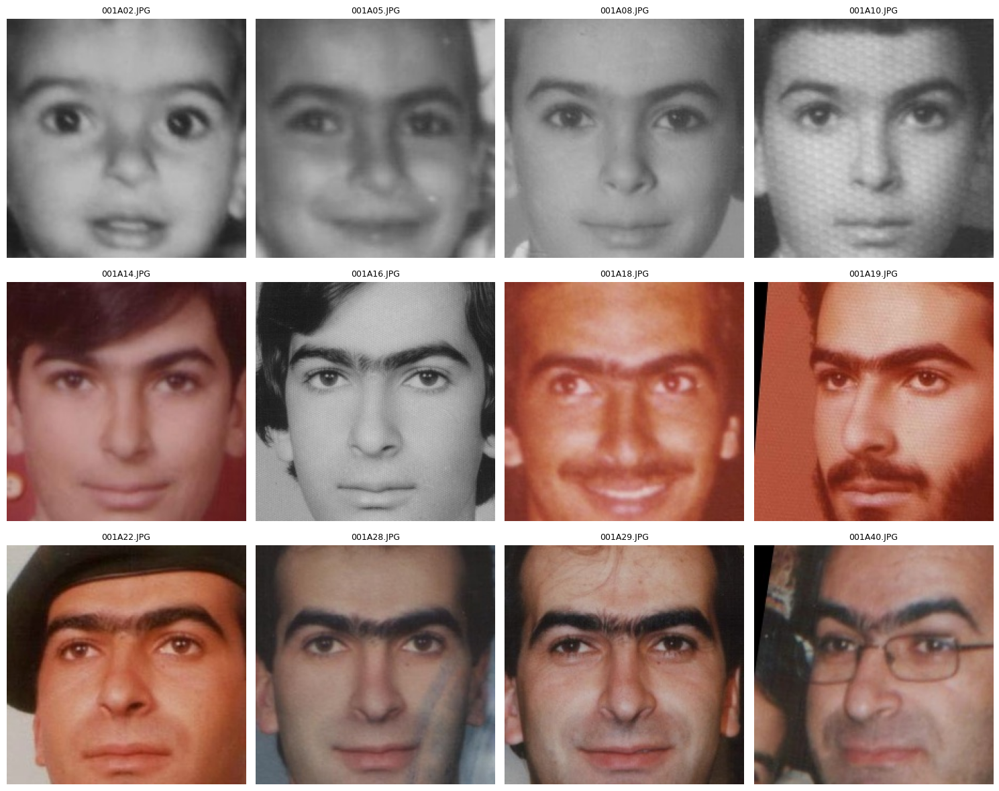

In [13]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to your FGNET images
img_dir = "/kaggle/working/FGNET_processed"

# Number of first images to plot
n = 12

# Get all image file names and SORT them
all_images = sorted([f for f in os.listdir(img_dir) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Select the FIRST n images
selected_images = all_images[:n]

# Plot images
cols = 4  # number of columns
rows = (n + cols - 1) // cols  # number of rows

plt.figure(figsize=(15, 4 * rows))

for i, img_name in enumerate(selected_images):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path).convert("RGB")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(img_name, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

# AgeDB

In [14]:
!cp -r /kaggle/input/agedb-database/AgeDB /kaggle/working/

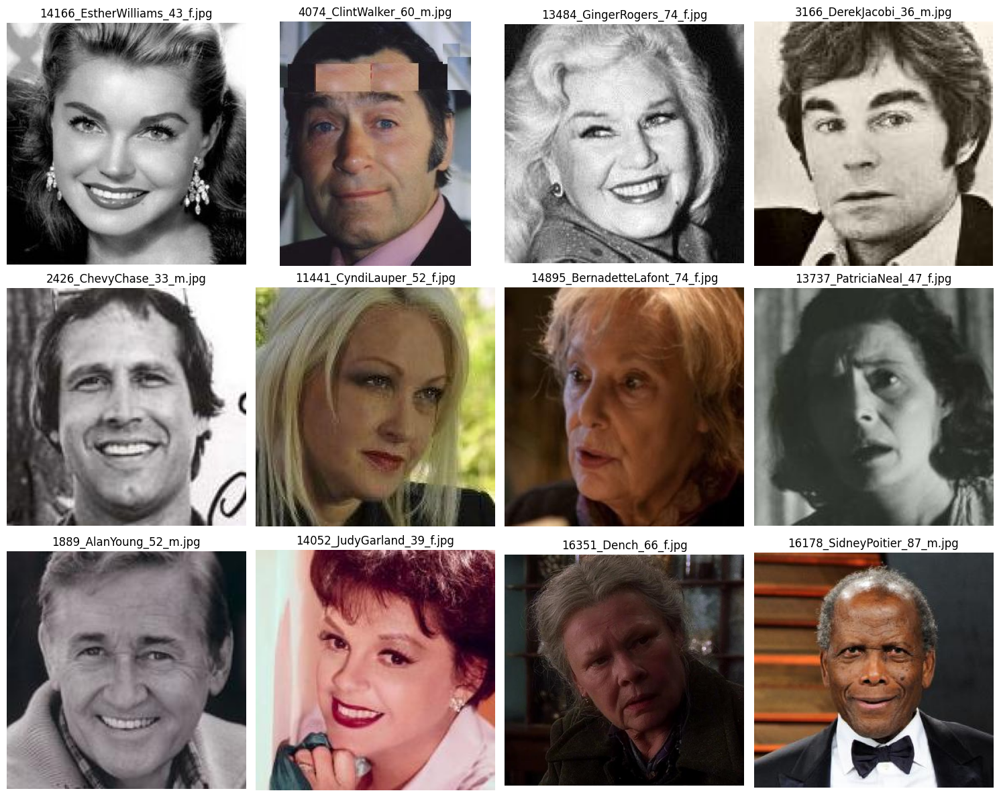

In [15]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Path to your AgeDB images
img_dir = "/kaggle/working/AgeDB"

# Number of random images to plot
n = 12

# Get all image file names
all_images = [f for f in os.listdir(img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select n images
selected_images = random.sample(all_images, n)

# Plot images
cols = 4  # number of columns in the plot
rows = (n + cols - 1) // cols  # calculate number of rows needed

plt.figure(figsize=(15, 4 * rows))
for i, img_name in enumerate(selected_images):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path).convert("RGB")
    
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(img_name)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [16]:
# Remove ALL spaces from filename

import os

folder_path = "/kaggle/working/AgeDB"

renamed_count = 0
skipped_count = 0

print("\n🔍 Scanning for filenames with spaces...\n")

for filename in os.listdir(folder_path):
    if not filename.lower().endswith(".jpg"):
        continue

    if " " not in filename:
        continue  # ✅ Skip clean files

    old_path = os.path.join(folder_path, filename)

    # ✅ Remove ALL spaces from filename
    new_filename = filename.replace(" ", "")
    new_path = os.path.join(folder_path, new_filename)

    # print("OLD:", filename)
    # print("NEW:", new_filename)

    # ✅ Safety check: avoid overwriting existing files
    if os.path.exists(new_path):
        print("⚠️ SKIPPED (target already exists)\n")
        skipped_count += 1
        continue

    os.rename(old_path, new_path)
    # print("✅ RENAMED\n")
    renamed_count += 1

print("========== SUMMARY ==========")
print(f"✅ Total renamed files: {renamed_count}")
print(f"⚠️ Total skipped (name conflict): {skipped_count}")


🔍 Scanning for filenames with spaces...

========== SUMMARY ==========
✅ Total renamed files: 69
⚠️ Total skipped (name conflict): 0


In [17]:
import os
import pandas as pd

# Path to AgeDB images
img_dir = "/kaggle/working/AgeDB"

# List to store image info
data = []

# Iterate over all files in the folder
for filename in os.listdir(img_dir):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        filepath = os.path.join(img_dir, filename)
        
        # Split filename to extract info
        parts = filename.split('_')
        if len(parts) >= 4:
            identity = "_".join(parts[1:-2])  # handles multi-word names
            age = int(parts[-2])
            gender = parts[-1].split('.')[0]  # remove extension
        else:
            # fallback in case filename doesn't match pattern
            identity, age, gender = 'unknown', -1, 'unknown'
        
        data.append({
            'identity': identity,
            'age': age,
            'gender': gender,
            'filename': filename,
            'filepath': filepath
        })

# Create DataFrame
df = pd.DataFrame(data)

# Save to CSV
output_path = "/kaggle/working/AgeDB.csv"
df.to_csv(output_path, index=False)

print(f"CSV saved to: {output_path}")
df.head()

CSV saved to: /kaggle/working/AgeDB.csv


,identity,age,gender,filename,filepath
0,BurtLancaster,56,m,9282_BurtLancaster_56_m.jpg,/kaggle/working/AgeDB/9282_BurtLancaster_56_m.jpg
1,GordonThomson,64,m,4602_GordonThomson_64_m.jpg,/kaggle/working/AgeDB/4602_GordonThomson_64_m.jpg
2,angelamerkel,20,f,551_angelamerkel_20_f.jpg,/kaggle/working/AgeDB/551_angelamerkel_20_f.jpg
3,LawrenceTierney,34,m,9102_LawrenceTierney_34_m.jpg,/kaggle/working/AgeDB/9102_LawrenceTierney_34_...
4,JamesWoods,54,m,2625_JamesWoods_54_m.jpg,/kaggle/working/AgeDB/2625_JamesWoods_54_m.jpg


### AgeDB processing 

In [18]:
import cv2
import numpy as np
import os
import pandas as pd
from tqdm import tqdm
import insightface
from insightface.app import FaceAnalysis
from skimage import transform as trans
from concurrent.futures import ThreadPoolExecutor
import traceback
from collections import Counter

# ============================================================
# AGEDB PROPER LANDMARK-BASED FACE ALIGNMENT
# ============================================================

# Paths
input_csv_path = "/kaggle/working/AgeDB.csv"
output_dir = "/kaggle/working/AgeDB_processed"
output_csv_path = "/kaggle/working/AgeDB_processed.csv"
log_path = "/kaggle/working/processing_log.txt"

os.makedirs(output_dir, exist_ok=True)

# Performance settings
NUM_WORKERS = 4
GPU_ID = 0

# Output parameters
OUTPUT_SIZE = (160, 160)
DET_THRESHOLD = 0.10  # LOWER threshold for better recall

print("Loading InsightFace face detector...")
app = FaceAnalysis(
    allowed_modules=['detection', 'landmark_2d_106'],
    providers=['CUDAExecutionProvider', 'CPUExecutionProvider']
)
app.prepare(ctx_id=GPU_ID, det_size=(640, 640), det_thresh=DET_THRESHOLD)

# Standard reference points for alignment (from MTCNN/ArcFace)
# These are normalized coordinates for 112x112 images
src_112 = np.array([
    [38.2946, 51.6963],  # Left eye
    [73.5318, 51.5014],  # Right eye
    [56.0252, 71.7366],  # Nose tip
    [41.5493, 92.3655],  # Left mouth corner
    [70.7299, 92.2041]   # Right mouth corner
], dtype=np.float32)

# Scale to 160x160
src_160 = src_112 * (160.0 / 112.0)

def estimate_norm(lmk, image_size=160):
    """
    Estimate similarity transform from landmarks
    Args:
        lmk: 5 facial landmarks (left_eye, right_eye, nose, left_mouth, right_mouth)
        image_size: output image size
    """
    assert lmk.shape == (5, 2)
    
    # Use appropriate reference based on output size
    if image_size == 112:
        src = src_112
    else:
        src = src_160
    
    # Estimate similarity transform
    tform = trans.SimilarityTransform()
    tform.estimate(lmk, src)
    
    return tform

def align_face_landmarks(img, face, output_size=(160, 160)):
    """
    Align face using 5-point landmarks with similarity transform
    This properly rotates and scales the face so eyes are level
    """
    try:
        kps = face.kps
        
        if kps is None or len(kps) < 5:
            return None, "Insufficient landmarks", None
        
        # Get 5-point landmarks (InsightFace format)
        # kps is (5, 2): left_eye, right_eye, nose, left_mouth, right_mouth
        landmarks = kps.astype(np.float32)
        
        # Estimate transform
        tform = estimate_norm(landmarks, image_size=output_size[0])
        
        # Apply transform
        aligned = cv2.warpAffine(
            img, 
            tform.params[0:2, :], 
            output_size,
            borderValue=0.0
        )
        
        return aligned, None, {
            'bbox': face.bbox,
            'det_score': face.det_score,
            'transform': 'similarity'
        }
        
    except Exception as e:
        return None, f"Align error: {str(e)}", None

def load_image(filepath):
    """Safely load image"""
    try:
        if not os.path.exists(filepath):
            return None, "File not found", None
        
        img = cv2.imread(filepath)
        if img is None:
            return None, "Read failed", None
        
        # Handle different color formats
        if len(img.shape) == 2:
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        elif img.shape[2] == 4:
            img = cv2.cvtColor(img, cv2.COLOR_BGRA2RGB)
        else:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        if img.shape[0] < 30 or img.shape[1] < 30:
            return None, "Image too small", None
        
        return img, None, {'width': img.shape[1], 'height': img.shape[0]}
        
    except Exception as e:
        return None, f"Load error: {str(e)}", None

def process_single_image(row_data):
    """Process a single image with landmark-based alignment"""
    idx, row = row_data
    
    try:
        # Load image
        img, error, img_info = load_image(row['filepath'])
        if img is None:
            return None, f"{error}|{row['filepath']}"
        
        # Detect faces
        try:
            faces = app.get(img)
        except Exception as e:
            return None, f"Detection error|{row['filepath']}"
        
        if len(faces) == 0:
            return None, f"No face|{row['filepath']}"
        
        # Use largest face
        face = max(faces, key=lambda x: (x.bbox[2] - x.bbox[0]) * (x.bbox[3] - x.bbox[1]))
        
        # Align face using landmarks
        aligned, error, face_info = align_face_landmarks(
            img, face, output_size=OUTPUT_SIZE
        )
        
        if aligned is None:
            return None, f"{error}|{row['filepath']}"
        
        # Generate output path
        identity_dir = os.path.join(output_dir, str(row['identity']))
        os.makedirs(identity_dir, exist_ok=True)
        
        output_filename = f"{row['identity']}_{row['age']}_{row['gender']}_{idx:06d}.jpg"
        output_path = os.path.join(identity_dir, output_filename)
        
        # Save
        aligned_bgr = cv2.cvtColor(aligned, cv2.COLOR_RGB2BGR)
        success = cv2.imwrite(output_path, aligned_bgr, [cv2.IMWRITE_JPEG_QUALITY, 95])
        
        if not success:
            return None, f"Save failed|{row['filepath']}"
        
        return {
            'identity': row['identity'],
            'age': row['age'],
            'gender': row['gender'],
            'original_path': row['filepath'],
            'aligned_path': output_path,
            'img_size': f"{img_info['width']}x{img_info['height']}",
            'det_score': f"{face_info['det_score']:.3f}",
            'alignment': 'landmark_transform'
        }, None
        
    except Exception as e:
        return None, f"Unexpected:{str(e)}|{row['filepath']}"

# Load CSV
print("Loading AgeDB dataset CSV...")
df = pd.read_csv(input_csv_path)
print(f"Found {len(df)} images in CSV\n")

# Test first 5 images
print("="*70)
print("TESTING FIRST 5 IMAGES (with landmark alignment)")
print("="*70)
for i in range(min(5, len(df))):
    result, error = process_single_image((i, df.iloc[i]))
    if result:
        print(f"✓ {i}: {os.path.basename(result['original_path'])}")
        print(f"     {result['img_size']} -> {OUTPUT_SIZE}, Score: {result['det_score']}")
    else:
        print(f"✗ {i}: {os.path.basename(df.iloc[i]['filepath'])}")
        print(f"     {error.split('|')[0]}")
print("="*70 + "\n")

# Process all images
print(f"Processing {len(df)} images with {NUM_WORKERS} workers...")
print(f"Detection threshold: {DET_THRESHOLD}")
print(f"Alignment method: Landmark-based similarity transform\n")

results = []
failed_log = []

with ThreadPoolExecutor(max_workers=NUM_WORKERS) as executor:
    for result, error in tqdm(
        executor.map(process_single_image, df.iterrows()), 
        total=len(df),
        desc="Processing"
    ):
        if result is not None:
            results.append(result)
        else:
            failed_log.append(error)

# Save results
print("\nSaving results...")
if results:
    results_df = pd.DataFrame(results)
    results_df.to_csv(output_csv_path, index=False)
    print(f"Results saved to: {output_csv_path}")

if failed_log:
    with open(log_path, 'w') as f:
        f.write('\n'.join(failed_log))
    print(f"Failed images log saved to: {log_path}")

# Failure analysis
print("\n" + "="*70)
print("FAILURE ANALYSIS")
print("="*70)

error_counts = Counter([e.split('|')[0] for e in failed_log])
for error_type, count in error_counts.most_common(10):
    pct = 100 * count / len(failed_log) if failed_log else 0
    print(f"{error_type}: {count} ({pct:.1f}%)")

# Summary
print("\n" + "="*70)
print("PROCESSING COMPLETE")
print("="*70)
print(f"Successfully processed: {len(results)}/{len(df)} ({100*len(results)/len(df):.1f}%)")
print(f"Failed: {len(failed_log)}/{len(df)} ({100*len(failed_log)/len(df):.1f}%)")
print(f"Output directory: {output_dir}")
print("\nAlignment method: Landmark-based similarity transform")
print("Faces are now properly aligned with level eyes and consistent positioning")
print("="*70)

# Show detection score distribution
if results:
    results_df = pd.DataFrame(results)
    scores = results_df['det_score'].astype(float)
    print(f"\nDetection scores: min={scores.min():.3f}, max={scores.max():.3f}, avg={scores.mean():.3f}")
    print(f"Low confidence (<0.3): {(scores < 0.3).sum()} images")

Loading InsightFace face detector...
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
model ignore: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'

Processing: 100%|██████████| 16488/16488 [02:43<00:00, 101.13it/s]



Saving results...
Results saved to: /kaggle/working/AgeDB_processed.csv
Failed images log saved to: /kaggle/working/processing_log.txt

FAILURE ANALYSIS
No face: 942 (99.9%)
Image too small: 1 (0.1%)

PROCESSING COMPLETE
Successfully processed: 15545/16488 (94.3%)
Failed: 943/16488 (5.7%)
Output directory: /kaggle/working/AgeDB_processed

Alignment method: Landmark-based similarity transform
Faces are now properly aligned with level eyes and consistent positioning

Detection scores: min=0.100, max=0.907, avg=0.267
Low confidence (<0.3): 10986 images


In [19]:
import os

path = "/kaggle/working/AgeDB_processed/AbeVigoda"
files = sorted(os.listdir(path))
print(files[:20])


['AbeVigoda_20_m_011517.jpg', 'AbeVigoda_49_m_008527.jpg', 'AbeVigoda_51_m_000118.jpg', 'AbeVigoda_52_m_011745.jpg', 'AbeVigoda_53_m_007998.jpg', 'AbeVigoda_55_m_004259.jpg', 'AbeVigoda_56_m_003595.jpg', 'AbeVigoda_57_m_010617.jpg', 'AbeVigoda_58_m_012518.jpg', 'AbeVigoda_59_m_000131.jpg', 'AbeVigoda_60_m_009764.jpg', 'AbeVigoda_61_m_008799.jpg', 'AbeVigoda_62_m_003983.jpg', 'AbeVigoda_64_m_011367.jpg', 'AbeVigoda_65_m_000624.jpg', 'AbeVigoda_66_m_006760.jpg', 'AbeVigoda_68_m_015316.jpg', 'AbeVigoda_69_m_009868.jpg', 'AbeVigoda_70_m_009182.jpg', 'AbeVigoda_71_m_010830.jpg']


In [20]:

path = "/kaggle/working/AgeDB_processed/"
files = sorted(os.listdir(path))
print(files[:20])

['AbeVigoda', 'AdolfHitlerr', 'AlCorley', 'AlKapone', 'AlPacino', 'AlainDelon', 'AlanRickman', 'AlanYoung', 'AlbertCamus', 'AlbertSchweitzer', 'AlbertoSordi', 'AlecGuinness', 'AlejandroRey', 'AlexanderGrahamBell', 'AlexandrakisAlekos', 'AliMacGraw', 'AlikiBoug', 'AmandaBlake', 'AmandaRedman', 'AndreMarieAmpКre']


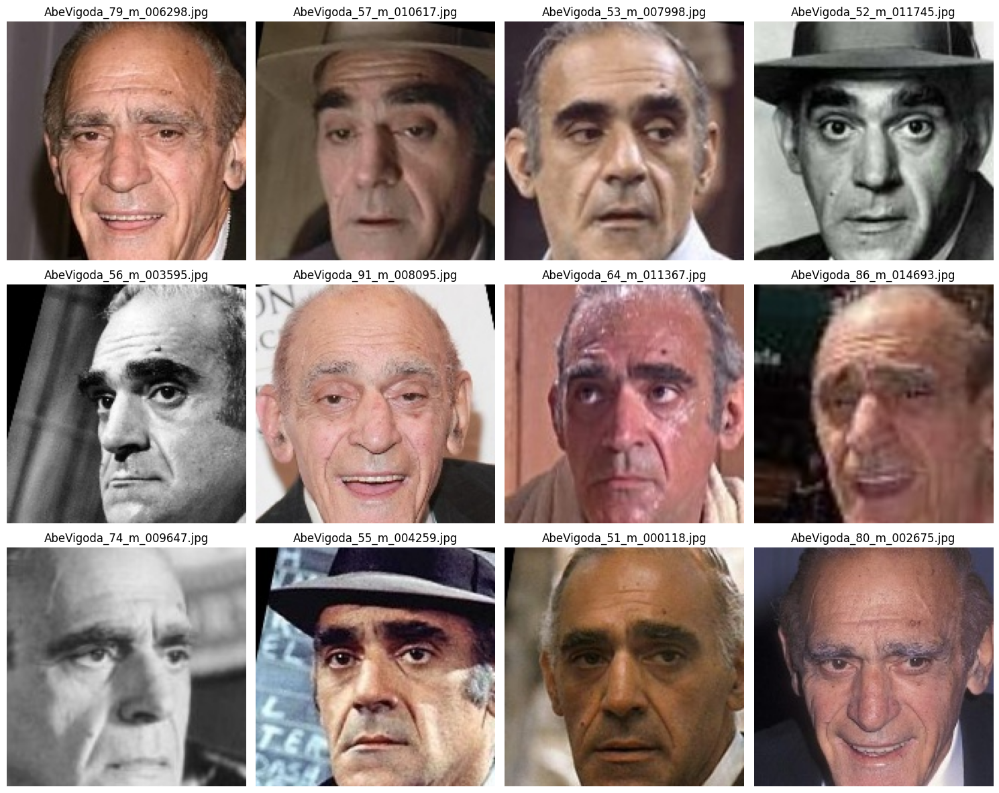

In [21]:
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

# Path to your AgeDB images
img_dir = "/kaggle/working/AgeDB_processed/AbeVigoda"

# Number of random images to plot
n = 12

# Get all image file names
all_images = [f for f in os.listdir(img_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

# Randomly select n images
selected_images = random.sample(all_images, n)

# Plot images
cols = 4  # number of columns in the plot
rows = (n + cols - 1) // cols  # calculate number of rows needed

plt.figure(figsize=(15, 4 * rows))
for i, img_name in enumerate(selected_images):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path).convert("RGB")
    
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(img_name)
    plt.axis('off')

plt.tight_layout()
plt.show()

# CACD 

In [22]:
import pandas as pd 
cacd = pd.read_csv('/kaggle/input/cacd-filtered-dataset/CACD_features_sex.csv')
cacd

,Unnamed: 0,age,identity,year,rank,lfw,birth,name,gender
0,0,53,1,2004,1,1,1951,53_Robin_Williams_0001.jpg,M
1,1,53,1,2004,1,1,1951,53_Robin_Williams_0002.jpg,M
2,2,53,1,2004,1,1,1951,53_Robin_Williams_0003.jpg,M
3,3,53,1,2004,1,1,1951,53_Robin_Williams_0004.jpg,M
4,4,53,1,2004,1,1,1951,53_Robin_Williams_0005.jpg,M
...,...,...,...,...,...,...,...,...,...
154910,163441,23,2000,2013,50,0,1990,23_Katie_Findlay_0009.jpg,F
154911,163442,23,2000,2013,50,0,1990,23_Katie_Findlay_0010.jpg,F
154912,163443,23,2000,2013,50,0,1990,23_Katie_Findlay_0011.jpg,F
154913,163444,23,2000,2013,50,0,1990,23_Katie_Findlay_0012.jpg,F


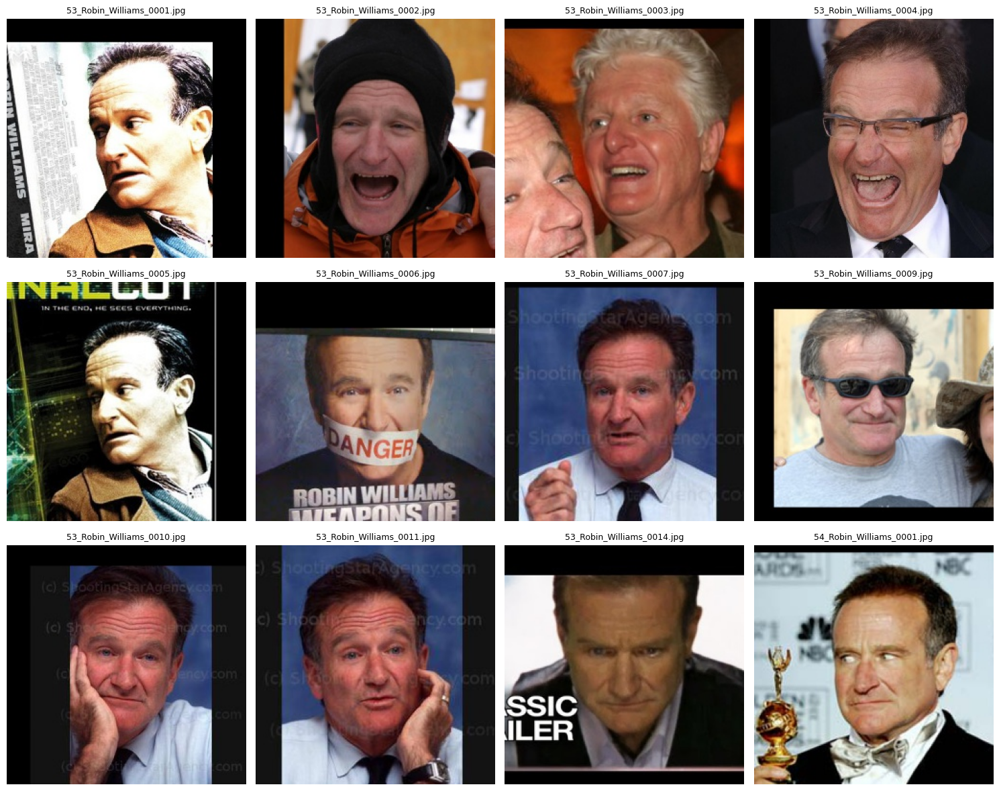

In [23]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to your FGNET images
img_dir = "/kaggle/input/cacd-filtered-dataset/cacd_split/cacd_split/RobinWilliams"

# Number of first images to plot
n = 12

# Get all image file names and SORT them
all_images = sorted([f for f in os.listdir(img_dir) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Select the FIRST n images
selected_images = all_images[:n]

# Plot images
cols = 4  # number of columns
rows = (n + cols - 1) // cols  # number of rows

plt.figure(figsize=(15, 4 * rows))

for i, img_name in enumerate(selected_images):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path).convert("RGB")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(img_name, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [24]:
import os
import pandas as pd

# Paths
META_CSV = "/kaggle/input/cacd-filtered-dataset/CACD_features_sex.csv"
IMG_BASE_DIR = "/kaggle/input/cacd-filtered-dataset/cacd_split/cacd_split"
OUT_CSV = "/kaggle/working/cacd.csv"

# Build filename -> filepath map by walking the image directory
file_to_path = {}
for root, dirs, files in os.walk(IMG_BASE_DIR):
    for f in files:
        if f.lower().endswith((".jpg", ".jpeg", ".png")):
            # store exact filename mapping, if duplicate filenames exist across folders the first wins
            file_to_path[f] = os.path.join(root, f)

# Also prepare a lowercase-to-path mapping for case-insensitive lookup
lower_map = {fn.lower(): p for fn, p in file_to_path.items()}

# Load metadata CSV
cacd = pd.read_csv(META_CSV)

records = []
missing = []

for idx, row in cacd.iterrows():
    filename = str(row['name'])  # column 'name' contains filename like '36_Aaron_Williams_0001.jpg'
    identity = str(row['identity']) if 'identity' in row and not pd.isna(row['identity']) else ""
    age = int(row['age']) if 'age' in row and not pd.isna(row['age']) else -1
    gender = str(row['gender']).lower() if 'gender' in row and not pd.isna(row['gender']) else "unknown"
    
    # Find filepath using mapping (exact match first, then case-insensitive)
    filepath = file_to_path.get(filename)
    if filepath is None:
        filepath = lower_map.get(filename.lower())
    if filepath is None:
        # Try to search filename basename among keys (rare) - fallback: None
        missing.append(filename)
        filepath = os.path.join(IMG_BASE_DIR, filename)  # fallback path (may be wrong)
    
    records.append({
        "identity": identity,
        "age": age,
        "gender": gender,
        "filename": filename,
        "filepath": filepath
    })

# Create dataframe and save
out_df = pd.DataFrame(records, columns=["identity", "age", "gender", "filename", "filepath"])
out_df.to_csv(OUT_CSV, index=False)

print(f"Saved: {OUT_CSV}")
print(f"Total rows: {len(out_df)}")
print(f"Missing files (not found under '{IMG_BASE_DIR}'): {len(missing)}")
if missing:
    print("Examples of missing filenames:", missing[:10])

Saved: /kaggle/working/cacd.csv
Total rows: 154915
Missing files (not found under '/kaggle/input/cacd-filtered-dataset/cacd_split/cacd_split'): 0


In [25]:
cacd = pd.read_csv('/kaggle/working/cacd.csv')
cacd 

,identity,age,gender,filename,filepath
0,1,53,m,53_Robin_Williams_0001.jpg,/kaggle/input/cacd-filtered-dataset/cacd_split...
1,1,53,m,53_Robin_Williams_0002.jpg,/kaggle/input/cacd-filtered-dataset/cacd_split...
2,1,53,m,53_Robin_Williams_0003.jpg,/kaggle/input/cacd-filtered-dataset/cacd_split...
3,1,53,m,53_Robin_Williams_0004.jpg,/kaggle/input/cacd-filtered-dataset/cacd_split...
4,1,53,m,53_Robin_Williams_0005.jpg,/kaggle/input/cacd-filtered-dataset/cacd_split...
...,...,...,...,...,...
154910,2000,23,f,23_Katie_Findlay_0009.jpg,/kaggle/input/cacd-filtered-dataset/cacd_split...
154911,2000,23,f,23_Katie_Findlay_0010.jpg,/kaggle/input/cacd-filtered-dataset/cacd_split...
154912,2000,23,f,23_Katie_Findlay_0011.jpg,/kaggle/input/cacd-filtered-dataset/cacd_split...
154913,2000,23,f,23_Katie_Findlay_0012.jpg,/kaggle/input/cacd-filtered-dataset/cacd_split...


In [26]:
import cv2
import numpy as np
import os
import pandas as pd
from tqdm import tqdm
import insightface
from insightface.app import FaceAnalysis
from skimage import transform as trans
from concurrent.futures import ThreadPoolExecutor
import traceback

# ============================================================
# FIXED CACD FACE ALIGNMENT - GPU BATCH PROCESSING
# ============================================================

# Paths
input_csv_path = "/kaggle/working/cacd.csv"
output_dir = "/kaggle/working/CACD_processed"
output_csv_path = "/kaggle/working/CACD_processed.csv"
log_path = "/kaggle/working/processing_log.txt"

# Create output directory
os.makedirs(output_dir, exist_ok=True)

# Performance settings
BATCH_SIZE = 32  # Reduced for stability
NUM_WORKERS = 4
GPU_ID = 0

# Output parameters
OUTPUT_SIZE = (160, 160)
BBOX_SCALE = 1  # Expand bbox by 50%

# Initialize InsightFace
print("Loading InsightFace face detector...")
app = FaceAnalysis(
    allowed_modules=['detection', 'landmark_2d_106'],
    providers=['CUDAExecutionProvider', 'CPUExecutionProvider']
)
app.prepare(ctx_id=GPU_ID, det_size=(640, 640), det_thresh=0.3)

def align_face_insightface(img, face, output_size=(160, 160), bbox_scale=1.1):
    """
    Align face using InsightFace landmarks with bbox expansion
    """
    try:
        kps = face.kps
        
        if kps is None or len(kps) < 2:
            return None
        
        # Get and expand bounding box
        bbox = face.bbox
        x1, y1, x2, y2 = bbox
        
        center_x = (x1 + x2) / 2
        center_y = (y1 + y2) / 2
        width = x2 - x1
        height = y2 - y1
        
        new_width = width * bbox_scale
        new_height = height * bbox_scale
        
        new_x1 = max(0, int(center_x - new_width / 2))
        new_y1 = max(0, int(center_y - new_height / 2))
        new_x2 = min(img.shape[1], int(center_x + new_width / 2))
        new_y2 = min(img.shape[0], int(center_y + new_height / 2))
        
        # Crop expanded region
        cropped = img[new_y1:new_y2, new_x1:new_x2]
        
        if cropped.size == 0:
            return None
        
        # Resize to output size
        aligned = cv2.resize(cropped, output_size, interpolation=cv2.INTER_LINEAR)
        
        return aligned
        
    except Exception as e:
        return None

def load_image(filepath):
    """Safely load image"""
    try:
        if not os.path.exists(filepath):
            return None, f"File not found: {filepath}"
        
        img = cv2.imread(filepath)
        
        if img is None:
            return None, f"Failed to read: {filepath}"
        
        # Convert BGR to RGB
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        return img, None
        
    except Exception as e:
        return None, f"Error loading {filepath}: {str(e)}"

def process_single_image(row_data):
    """Process a single image"""
    idx, row = row_data
    
    try:
        # Load image
        img, error = load_image(row['filepath'])
        if img is None:
            return None, error
        
        # Detect faces
        faces = app.get(img)
        
        if len(faces) == 0:
            return None, f"No face detected: {row['filepath']}"
        
        # Use largest face
        face = max(faces, key=lambda x: (x.bbox[2] - x.bbox[0]) * (x.bbox[3] - x.bbox[1]))
        
        # Align face
        aligned = align_face_insightface(img, face, output_size=OUTPUT_SIZE, bbox_scale=BBOX_SCALE)
        
        if aligned is None:
            return None, f"Alignment failed: {row['filepath']}"
        
        # Generate output path
        identity_dir = os.path.join(output_dir, str(row['identity']))
        os.makedirs(identity_dir, exist_ok=True)
        
        output_filename = f"{row['identity']}_{row['age']}_{row['gender']}_{idx:06d}.jpg"
        output_path = os.path.join(identity_dir, output_filename)
        
        # Save (convert back to BGR for cv2)
        aligned_bgr = cv2.cvtColor(aligned, cv2.COLOR_RGB2BGR)
        cv2.imwrite(output_path, aligned_bgr, [cv2.IMWRITE_JPEG_QUALITY, 95])
        
        # Return success data
        return {
            'identity': row['identity'],
            'age': row['age'],
            'gender': row['gender'],
            'original_path': row['filepath'],
            'aligned_path': output_path
        }, None
        
    except Exception as e:
        return None, f"Unexpected error {row['filepath']}: {traceback.format_exc()}"

# Load CSV
print("Loading CACD dataset CSV...")
df = pd.read_csv(input_csv_path)
print(f"Found {len(df)} images in CSV")

# Process images
print(f"\nProcessing images with {NUM_WORKERS} workers...")
results = []
failed_log = []

with ThreadPoolExecutor(max_workers=NUM_WORKERS) as executor:
    # Process with progress bar
    for result, error in tqdm(
        executor.map(process_single_image, df.iterrows()), 
        total=len(df),
        desc="Processing"
    ):
        if result is not None:
            results.append(result)
        else:
            failed_log.append(error)

# Save results
print("\nSaving results...")
if results:
    results_df = pd.DataFrame(results)
    results_df.to_csv(output_csv_path, index=False)
    print(f"Results saved to: {output_csv_path}")

# Save failure log
if failed_log:
    with open(log_path, 'w') as f:
        f.write('\n'.join(failed_log))
    print(f"Failed images log saved to: {log_path}")

# Summary
print("\n" + "="*60)
print("PROCESSING COMPLETE")
print("="*60)
print(f"Successfully processed: {len(results)}/{len(df)} images ({100*len(results)/len(df):.1f}%)")
print(f"Failed: {len(failed_log)}/{len(df)} images ({100*len(failed_log)/len(df):.1f}%)")
print(f"Output directory: {output_dir}")
print("="*60)

Loading InsightFace face detector...
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}, 'CUDAExecutionProvider': {'sdpa_kernel': '0', 'use_tf32': '1', 'fuse_conv_bias': '0', 'prefer_nhwc': '0', 'tunable_op_max_tuning_duration_ms': '0', 'enable_skip_layer_norm_strict_mode': '0', 'tunable_op_tuning_enable': '0', 'tunable_op_enable': '0', 'use_ep_level_unified_stream': '0', 'device_id': '0', 'has_user_compute_stream': '0', 'gpu_external_empty_cache': '0', 'cudnn_conv_algo_search': 'EXHAUSTIVE', 'cudnn_conv1d_pad_to_nc1d': '0', 'gpu_mem_limit': '18446744073709551615', 'gpu_external_alloc': '0', 'gpu_external_free': '0', 'arena_extend_strategy': 'kNextPowerOfTwo', 'do_copy_in_default_stream': '1', 'enable_cuda_graph': '0', 'user_compute_stream': '0', 'cudnn_conv_use_max_workspace': '1'}}
model ignore: /root/.insightface/models/buffalo_l/1k3d68.onnx landmark_3d_68
Applied providers: ['CUDAExecutionProvider', 'CPUExecutionProvider'

Processing: 100%|██████████| 154915/154915 [26:43<00:00, 96.62it/s] 



Saving results...
Results saved to: /kaggle/working/CACD_processed.csv
Failed images log saved to: /kaggle/working/processing_log.txt

PROCESSING COMPLETE
Successfully processed: 154383/154915 images (99.7%)
Failed: 532/154915 images (0.3%)
Output directory: /kaggle/working/CACD_processed


In [27]:
cacd_processed = pd.read_csv("/kaggle/working/CACD_processed.csv")
cacd_processed

,identity,age,gender,original_path,aligned_path
0,1,53,m,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/1/1_53_m_000000...
1,1,53,m,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/1/1_53_m_000001...
2,1,53,m,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/1/1_53_m_000002...
3,1,53,m,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/1/1_53_m_000003...
4,1,53,m,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/1/1_53_m_000004...
...,...,...,...,...,...
154378,2000,23,f,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/2000/2000_23_f_...
154379,2000,23,f,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/2000/2000_23_f_...
154380,2000,23,f,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/2000/2000_23_f_...
154381,2000,23,f,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/2000/2000_23_f_...


In [28]:
cacd_processed['identity'].value_counts()

identity
1852    135
1319    133
361     128
1353    127
858     125
       ... 
1583     27
1976     26
241      26
580      24
397      22
Name: count, Length: 2000, dtype: int64

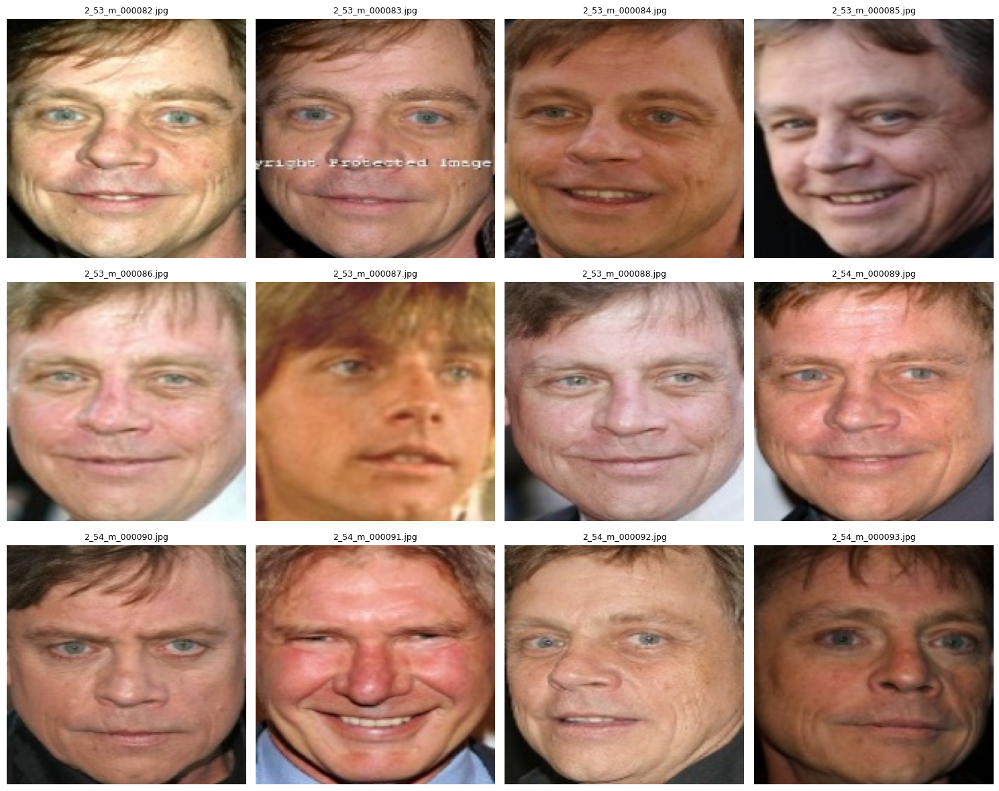

In [29]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to your FGNET images
img_dir = "/kaggle/working/CACD_processed/2"

# Number of first images to plot
n = 12

# Get all image file names and SORT them
all_images = sorted([f for f in os.listdir(img_dir) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Select the FIRST n images
selected_images = all_images[:n]

# Plot images
cols = 4  # number of columns
rows = (n + cols - 1) // cols  # number of rows

plt.figure(figsize=(15, 4 * rows))

for i, img_name in enumerate(selected_images):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path).convert("RGB")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(img_name, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

# Morph

In [30]:
import os
import re
import pandas as pd

BASE_DIR = "/kaggle/input/morph/Dataset/Images"
OUTPUT_DIR = "/kaggle/working"

splits = {
    "Train": "morph_train.csv",
    "Test": "morph_test.csv",
    "Validation": "morph_val.csv"
}

# Regex: capture identity (everything before underscore), 
# then somewhere after underscore find a gender (M or F) and age digits at the end.
# Examples matched: 00013_01M19.JPG, 093092_4M35.JPG, 118481_0F31.JPG
pattern = re.compile(r'^(?P<identity>[^_]+)_(?P<rest>.+?)(?P<gender>[MFmf])(?P<age>\d{1,2})$', re.IGNORECASE)

for split_name, csv_name in splits.items():
    split_path = os.path.join(BASE_DIR, split_name)
    records = []
    if not os.path.isdir(split_path):
        print(f"Skip (not found): {split_path}")
        continue

    for filename in sorted(os.listdir(split_path)):
        if not filename.lower().endswith((".jpg", ".jpeg", ".png")):
            continue
        m = pattern.match(filename.split(".")[0])
        filepath = os.path.join(split_path, filename)

        if m:
            identity = m.group("identity")      # keep as string (preserves leading zeros)
            gender = m.group("gender").lower()  # 'm' or 'f'
            age = int(m.group("age"))
        else:
            # fallback if regex fails
            identity = filename.split("_")[0]
            # try to infer last letter digit sequence:
            gender = "unknown"
            age = -1

        records.append({
            "identity": identity,
            "age": age,
            "gender": gender,
            "filename": filename,
            "filepath": filepath
        })

    df = pd.DataFrame(records)

    # Save CSV, forcing identity column to be quoted as strings is not necessary,
    # but when reading later you can use dtype={'identity': str}
    out_path = os.path.join(OUTPUT_DIR, csv_name)
    df.to_csv(out_path, index=False)
    print(f"Saved {out_path}  (rows={len(df)})")

Saved /kaggle/working/morph_train.csv  (rows=40012)
Saved /kaggle/working/morph_test.csv  (rows=5002)
Saved /kaggle/working/morph_val.csv  (rows=5001)


In [31]:
train_morph = pd.read_csv("/kaggle/working/morph_train.csv")
test_morph = pd.read_csv("/kaggle/working/morph_test.csv")
val_morph = pd.read_csv("/kaggle/working/morph_val.csv")

In [32]:
import pandas as pd

morph = pd.concat(
    [train_morph, val_morph, test_morph],
    axis=0,
    ignore_index=True
)

# Check result
morph.head()

,identity,age,gender,filename,filepath
0,13,19,m,00013_00M19.JPG,/kaggle/input/morph/Dataset/Images/Train/00013...
1,13,19,m,00013_01M19.JPG,/kaggle/input/morph/Dataset/Images/Train/00013...
2,13,19,m,00013_02M19.JPG,/kaggle/input/morph/Dataset/Images/Train/00013...
3,22,19,m,00022_03M19.JPG,/kaggle/input/morph/Dataset/Images/Train/00022...
4,22,20,m,00022_04M20.JPG,/kaggle/input/morph/Dataset/Images/Train/00022...


In [33]:
len(morph)

50015

In [34]:
morph.to_csv(
    "morph.csv",
    index=False
)

In [35]:
morph = pd.read_csv("/kaggle/working/morph.csv")
morph.tail()

,identity,age,gender,filename,filepath
50010,9893,59,m,9893_38M59.JPG,/kaggle/input/morph/Dataset/Images/Test/9893_3...
50011,99023,17,m,99023_02M17.JPG,/kaggle/input/morph/Dataset/Images/Test/99023_...
50012,99023,19,m,99023_05M19.JPG,/kaggle/input/morph/Dataset/Images/Test/99023_...
50013,99267,22,m,99267_05M22.JPG,/kaggle/input/morph/Dataset/Images/Test/99267_...
50014,99702,21,m,99702_04M21.JPG,/kaggle/input/morph/Dataset/Images/Test/99702_...


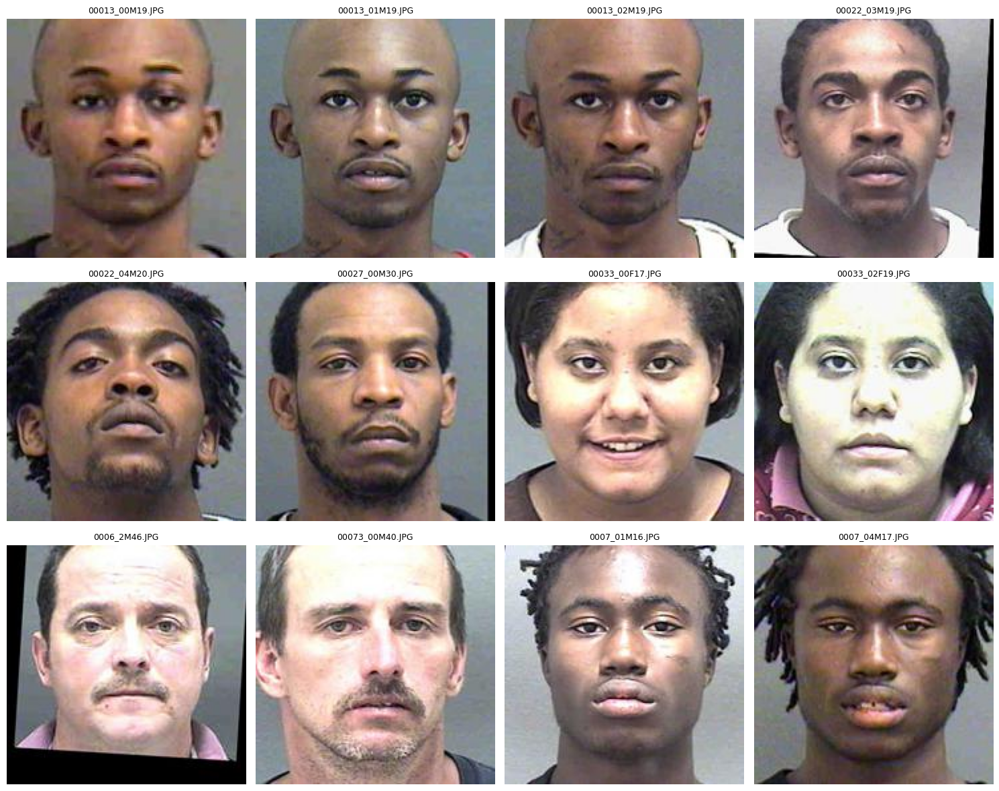

In [36]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to your FGNET images
img_dir = "/kaggle/input/morph/Dataset/Images/Train"

# Number of first images to plot
n = 12

# Get all image file names and SORT them
all_images = sorted([f for f in os.listdir(img_dir) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Select the FIRST n images
selected_images = all_images[:n]

# Plot images
cols = 4  # number of columns
rows = (n + cols - 1) // cols  # number of rows

plt.figure(figsize=(15, 4 * rows))

for i, img_name in enumerate(selected_images):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path).convert("RGB")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(img_name, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [37]:
import cv2
import numpy as np
import os
import pandas as pd
from tqdm import tqdm
from concurrent.futures import ThreadPoolExecutor
from collections import Counter

# ============================================================
# MORPH FACE RE-CROPPING (Images Already Aligned)
# ============================================================

# Paths
input_csv_path = "/kaggle/working/morph.csv"
output_dir = "/kaggle/working/MORPH_processed"
output_csv_path = "/kaggle/working/MORPH_processed.csv"
log_path = "/kaggle/working/processing_log.txt"

# Create output directory
os.makedirs(output_dir, exist_ok=True)

# Performance settings
NUM_WORKERS = 8  # Can use more since no GPU needed

# Output parameters
OUTPUT_SIZE = (160, 160)
CROP_SCALE = 0.7  # Use center 85% of image (adjust if faces are cut off)
# Set to 0.9 for less aggressive crop, 0.8 for more aggressive

def center_crop_and_resize(img, crop_scale=0.85, output_size=(160, 160)):
    """
    Take center crop of already-aligned face image and resize
    Args:
        img: input image (already face-cropped)
        crop_scale: portion of image to keep (0.85 = keep center 85%)
        output_size: final output dimensions
    """
    try:
        h, w = img.shape[:2]
        
        # Calculate center crop dimensions
        crop_h = int(h * crop_scale)
        crop_w = int(w * crop_scale)
        
        # Calculate crop coordinates (centered)
        y1 = (h - crop_h) // 2
        x1 = (w - crop_w) // 2
        y2 = y1 + crop_h
        x2 = x1 + crop_w
        
        # Crop
        cropped = img[y1:y2, x1:x2]
        
        if cropped.size == 0:
            return None, "Crop failed"
        
        # Resize to output size
        resized = cv2.resize(cropped, output_size, interpolation=cv2.INTER_LINEAR)
        
        return resized, None
        
    except Exception as e:
        return None, f"Crop error: {str(e)}"

def load_image(filepath):
    """Safely load image with grayscale handling"""
    try:
        if not os.path.exists(filepath):
            return None, "File not found"
        
        img = cv2.imread(filepath)
        
        if img is None:
            return None, "Read failed"
        
        # Handle different color formats
        if len(img.shape) == 2:  # Grayscale
            img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        elif img.shape[2] == 4:  # RGBA
            img = cv2.cvtColor(img, cv2.COLOR_BGRA2RGB)
        else:  # BGR
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        
        # Validate image size
        if img.shape[0] < 20 or img.shape[1] < 20:
            return None, "Image too small"
        
        return img, None
        
    except Exception as e:
        return None, f"Load error: {str(e)}"

def process_single_image(row_data):
    """Process a single pre-aligned face image"""
    idx, row = row_data
    
    try:
        # Load image
        img, error = load_image(row['filepath'])
        if img is None:
            return None, f"{error}|{row['filepath']}"
        
        # Crop and resize (no detection needed!)
        processed, error = center_crop_and_resize(
            img, 
            crop_scale=CROP_SCALE, 
            output_size=OUTPUT_SIZE
        )
        
        if processed is None:
            return None, f"{error}|{row['filepath']}"
        
        # Generate output path
        identity_dir = os.path.join(output_dir, str(row['identity']))
        os.makedirs(identity_dir, exist_ok=True)
        
        output_filename = f"{row['identity']}_{row['age']}_{row['gender']}_{idx:06d}.jpg"
        output_path = os.path.join(identity_dir, output_filename)
        
        # Save (convert back to BGR for cv2)
        processed_bgr = cv2.cvtColor(processed, cv2.COLOR_RGB2BGR)
        success = cv2.imwrite(output_path, processed_bgr, [cv2.IMWRITE_JPEG_QUALITY, 95])
        
        if not success:
            return None, f"Save failed|{row['filepath']}"
        
        # Return success data
        return {
            'identity': row['identity'],
            'age': row['age'],
            'gender': row['gender'],
            'original_path': row['filepath'],
            'aligned_path': output_path,
            'original_size': f"{img.shape[1]}x{img.shape[0]}"
        }, None
        
    except Exception as e:
        return None, f"Unexpected: {str(e)}|{row['filepath']}"

# Load CSV
print("Loading MORPH dataset CSV...")
df = pd.read_csv(input_csv_path)
print(f"Found {len(df)} images in CSV")

# Test first image
print("\n" + "="*60)
print("TESTING FIRST IMAGE")
print("="*60)
test_result, test_error = process_single_image((0, df.iloc[0]))
if test_result:
    print("✓ Test image processed successfully")
    print(f"  Original size: {test_result['original_size']}")
    print(f"  Output: {test_result['aligned_path']}")
else:
    print(f"✗ Test image failed: {test_error}")
print("="*60 + "\n")

# Process all images
print(f"Processing {len(df)} images with {NUM_WORKERS} workers...")
print(f"Crop scale: {CROP_SCALE} (using center {int(CROP_SCALE*100)}% of each image)")
print(f"Output size: {OUTPUT_SIZE}\n")

results = []
failed_log = []

with ThreadPoolExecutor(max_workers=NUM_WORKERS) as executor:
    for result, error in tqdm(
        executor.map(process_single_image, df.iterrows()), 
        total=len(df),
        desc="Processing"
    ):
        if result is not None:
            results.append(result)
        else:
            failed_log.append(error)

# Save results
print("\nSaving results...")
if results:
    results_df = pd.DataFrame(results)
    results_df.to_csv(output_csv_path, index=False)
    print(f"Results saved to: {output_csv_path}")

# Save failure log
if failed_log:
    with open(log_path, 'w') as f:
        f.write('\n'.join(failed_log))
    print(f"Failed images log saved to: {log_path}")
    
    # Analyze failures
    print("\n" + "="*60)
    print("FAILURE ANALYSIS")
    print("="*60)
    error_categories = Counter([e.split('|')[0] for e in failed_log[:1000]])
    for error_type, count in error_categories.most_common(10):
        print(f"{error_type}: {count}")

# Summary
print("\n" + "="*60)
print("PROCESSING COMPLETE")
print("="*60)
print(f"Successfully processed: {len(results)}/{len(df)} images ({100*len(results)/len(df):.1f}%)")
print(f"Failed: {len(failed_log)}/{len(df)} images ({100*len(failed_log)/len(df):.1f}%)")
print(f"Output directory: {output_dir}")
print("="*60)

# Show sample of processed images
if results:
    print("\nSample of processed images:")
    for i in range(min(5, len(results))):
        r = results[i]
        print(f"  {r['identity']}_{r['age']}_{r['gender']} -> {r['aligned_path']}")

Loading MORPH dataset CSV...
Found 50015 images in CSV

TESTING FIRST IMAGE
✓ Test image processed successfully
  Original size: 180x180
  Output: /kaggle/working/MORPH_processed/13/13_19_m_000000.jpg

Processing 50015 images with 8 workers...
Crop scale: 0.7 (using center 70% of each image)
Output size: (160, 160)



Processing: 100%|██████████| 50015/50015 [00:52<00:00, 959.14it/s] 



Saving results...
Results saved to: /kaggle/working/MORPH_processed.csv

PROCESSING COMPLETE
Successfully processed: 50015/50015 images (100.0%)
Failed: 0/50015 images (0.0%)
Output directory: /kaggle/working/MORPH_processed

Sample of processed images:
  13_19_m -> /kaggle/working/MORPH_processed/13/13_19_m_000000.jpg
  13_19_m -> /kaggle/working/MORPH_processed/13/13_19_m_000001.jpg
  13_19_m -> /kaggle/working/MORPH_processed/13/13_19_m_000002.jpg
  22_19_m -> /kaggle/working/MORPH_processed/22/22_19_m_000003.jpg
  22_20_m -> /kaggle/working/MORPH_processed/22/22_20_m_000004.jpg


In [38]:
morph_processed = pd.read_csv("/kaggle/working/MORPH_processed.csv")
morph_processed

,identity,age,gender,original_path,aligned_path,original_size
0,13,19,m,/kaggle/input/morph/Dataset/Images/Train/00013...,/kaggle/working/MORPH_processed/13/13_19_m_000...,180x180
1,13,19,m,/kaggle/input/morph/Dataset/Images/Train/00013...,/kaggle/working/MORPH_processed/13/13_19_m_000...,180x180
2,13,19,m,/kaggle/input/morph/Dataset/Images/Train/00013...,/kaggle/working/MORPH_processed/13/13_19_m_000...,180x180
3,22,19,m,/kaggle/input/morph/Dataset/Images/Train/00022...,/kaggle/working/MORPH_processed/22/22_19_m_000...,180x180
4,22,20,m,/kaggle/input/morph/Dataset/Images/Train/00022...,/kaggle/working/MORPH_processed/22/22_20_m_000...,180x180
...,...,...,...,...,...,...
50010,9893,59,m,/kaggle/input/morph/Dataset/Images/Test/9893_3...,/kaggle/working/MORPH_processed/9893/9893_59_m...,180x180
50011,99023,17,m,/kaggle/input/morph/Dataset/Images/Test/99023_...,/kaggle/working/MORPH_processed/99023/99023_17...,180x180
50012,99023,19,m,/kaggle/input/morph/Dataset/Images/Test/99023_...,/kaggle/working/MORPH_processed/99023/99023_19...,180x180
50013,99267,22,m,/kaggle/input/morph/Dataset/Images/Test/99267_...,/kaggle/working/MORPH_processed/99267/99267_22...,180x180


In [39]:
import os

path = "/kaggle/working/MORPH_processed"

folder_counts = []

for folder in os.listdir(path):
    folder_path = os.path.join(path, folder)
    if os.path.isdir(folder_path):
        num_files = sum(
            os.path.isfile(os.path.join(folder_path, f))
            for f in os.listdir(folder_path)
        )
        folder_counts.append((folder, num_files))

# Sort by number of files (descending)
folder_counts = sorted(folder_counts, key=lambda x: x[1], reverse=True)

# Print results
i=0
for folder, count in folder_counts:
    if i > 10 :
        break
    print(f"{folder}: {count}")
    i= i+1


76181: 53
53653: 41
260710: 40
56111: 34
69975: 31
119893: 31
62276: 26
60237: 26
99857: 26
115931: 25
119392: 24


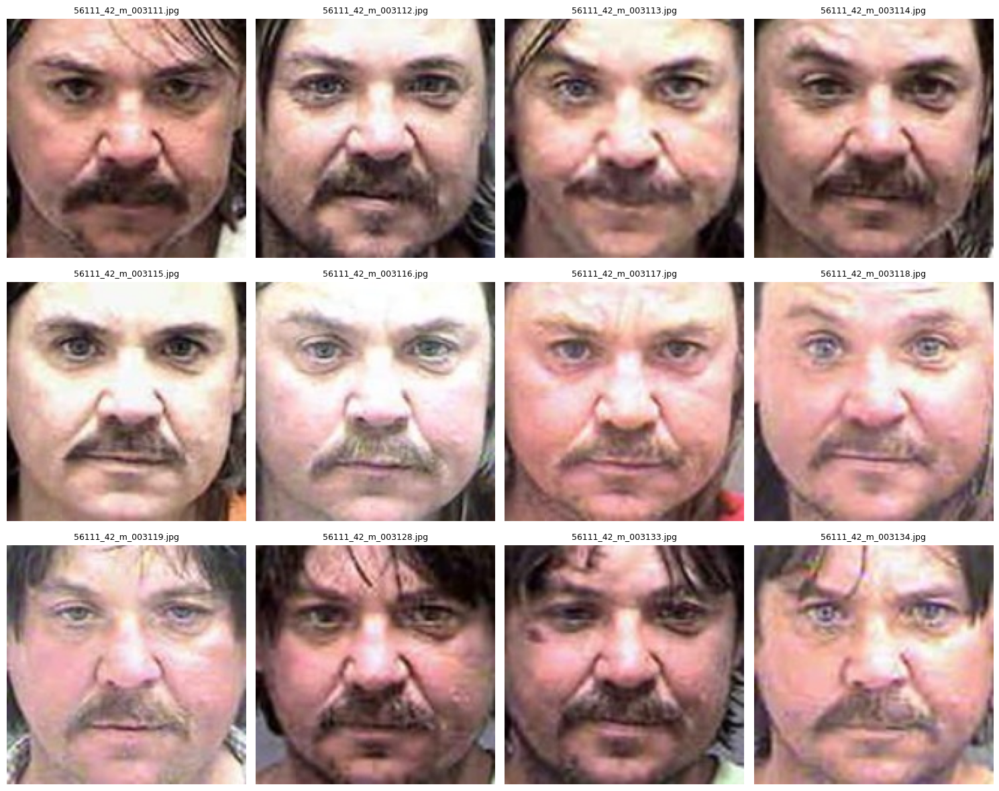

In [40]:
import os
from PIL import Image
import matplotlib.pyplot as plt

# Path to your FGNET images
img_dir = "/kaggle/working/MORPH_processed/56111"

# Number of first images to plot
n = 12

# Get all image file names and SORT them
all_images = sorted([f for f in os.listdir(img_dir) 
                      if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Select the FIRST n images
selected_images = all_images[:n]

# Plot images
cols = 4  # number of columns
rows = (n + cols - 1) // cols  # number of rows

plt.figure(figsize=(15, 4 * rows))

for i, img_name in enumerate(selected_images):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path).convert("RGB")

    plt.subplot(rows, cols, i + 1)
    plt.imshow(img)
    plt.title(img_name, fontsize=9)
    plt.axis('off')

plt.tight_layout()
plt.show()

# All

In [41]:
!tree -L 1 

.
├── AgeDB
├── AgeDB.csv
├── AgeDB_processed
├── AgeDB_processed.csv
├── cacd.csv
├── CACD_processed
├── CACD_processed.csv
├── fgnet.csv
├── FGNET_failed_samples
├── FGNET_processed
├── FGNET_processed.csv
├── morph.csv
├── MORPH_processed
├── MORPH_processed.csv
├── morph_test.csv
├── morph_train.csv
├── morph_val.csv
├── __notebook__.ipynb
└── processing_log.txt

6 directories, 13 files


In [42]:
!rm -r AgeDB 

In [43]:
!rm -r FGNET_failed_samples 

In [44]:
!rm AgeDB.csv cacd.csv fgnet.csv morph.csv morph_test.csv morph_train.csv morph_val.csv processing_log.txt

In [45]:
!tree -L 1 

.
├── AgeDB_processed
├── AgeDB_processed.csv
├── CACD_processed
├── CACD_processed.csv
├── FGNET_processed
├── FGNET_processed.csv
├── MORPH_processed
├── MORPH_processed.csv
└── __notebook__.ipynb

4 directories, 5 files


In [46]:
AgeDB_processed = pd.read_csv("/kaggle/working/AgeDB_processed.csv")
CACD_processed = pd.read_csv("/kaggle/working/CACD_processed.csv")
FGNET_processed = pd.read_csv("/kaggle/working/FGNET_processed.csv")
MORPH_processed = pd.read_csv("/kaggle/working/MORPH_processed.csv")

In [47]:
AgeDB_processed.tail()

,identity,age,gender,original_path,aligned_path,img_size,det_score,alignment
15540,JohnWayne,39,m,/kaggle/working/AgeDB/7190_JohnWayne_39_m.jpg,/kaggle/working/AgeDB_processed/JohnWayne/John...,194x194,0.423,landmark_transform
15541,DebbieReynolds,41,f,/kaggle/working/AgeDB/12035_DebbieReynolds_41_...,/kaggle/working/AgeDB_processed/DebbieReynolds...,101x102,0.119,landmark_transform
15542,EllenBurstyn,54,f,/kaggle/working/AgeDB/11003_EllenBurstyn_54_f.jpg,/kaggle/working/AgeDB_processed/EllenBurstyn/E...,193x194,0.307,landmark_transform
15543,Houston,23,f,/kaggle/working/AgeDB/16384_Houston_23_f.jpg,/kaggle/working/AgeDB_processed/Houston/Housto...,75x76,0.743,landmark_transform
15544,MarietteHartley,34,f,/kaggle/working/AgeDB/10282_MarietteHartley_34...,/kaggle/working/AgeDB_processed/MarietteHartle...,206x204,0.174,landmark_transform


In [48]:
CACD_processed.tail()

,identity,age,gender,original_path,aligned_path
154378,2000,23,f,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/2000/2000_23_f_...
154379,2000,23,f,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/2000/2000_23_f_...
154380,2000,23,f,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/2000/2000_23_f_...
154381,2000,23,f,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/2000/2000_23_f_...
154382,2000,23,f,/kaggle/input/cacd-filtered-dataset/cacd_split...,/kaggle/working/CACD_processed/2000/2000_23_f_...


In [49]:
FGNET_processed.tail()

,image_name,status,aligned_path,original_path,age,identity,det_score,bbox,error
997,082A22.JPG,success,/kaggle/working/FGNET_processed/082A22.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...,22,82.0,0.649043,"[70.85064697265625, 127.1081314086914, 332.031...",NaN
998,082A23.JPG,success,/kaggle/working/FGNET_processed/082A23.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...,23,82.0,0.735081,"[64.8366470336914, 169.5424346923828, 323.6397...",NaN
999,082A25.JPG,success,/kaggle/working/FGNET_processed/082A25.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...,25,82.0,0.462844,"[61.11900329589844, 109.4631118774414, 328.913...",NaN
1000,082A27.JPG,success,/kaggle/working/FGNET_processed/082A27.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A2...,27,82.0,0.491032,"[36.83100891113281, 117.59089660644531, 311.86...",NaN
1001,082A31.JPG,success,/kaggle/working/FGNET_processed/082A31.JPG,/kaggle/input/fgnet-dataset/FGNET/images/082A3...,31,82.0,0.574398,"[66.04776763916016, 117.8743896484375, 329.947...",NaN


In [50]:
MORPH_processed.tail()

,identity,age,gender,original_path,aligned_path,original_size
50010,9893,59,m,/kaggle/input/morph/Dataset/Images/Test/9893_3...,/kaggle/working/MORPH_processed/9893/9893_59_m...,180x180
50011,99023,17,m,/kaggle/input/morph/Dataset/Images/Test/99023_...,/kaggle/working/MORPH_processed/99023/99023_17...,180x180
50012,99023,19,m,/kaggle/input/morph/Dataset/Images/Test/99023_...,/kaggle/working/MORPH_processed/99023/99023_19...,180x180
50013,99267,22,m,/kaggle/input/morph/Dataset/Images/Test/99267_...,/kaggle/working/MORPH_processed/99267/99267_22...,180x180
50014,99702,21,m,/kaggle/input/morph/Dataset/Images/Test/99702_...,/kaggle/working/MORPH_processed/99702/99702_21...,180x180


In [51]:
import pandas as pd

datasets = {
    "AgeDB": AgeDB_processed,
    "CACD": CACD_processed,
    "FGNET": FGNET_processed,
    "MORPH": MORPH_processed,
}

def inspect_identity(df, name):
    print(f"\n{'='*60}")
    print(f"Dataset: {name}")
    print(f"{'='*60}")
    
    print("\n📌 Column dtypes:")
    print(df.dtypes)
    
    if "identity" in df.columns:
        print("\n🧍 Identity inspection:")
        print(f" - dtype            : {df['identity'].dtype}")
        print(f" - total rows       : {len(df)}")
        print(f" - unique identities: {df['identity'].nunique()}")
        print(" - sample identities:", df["identity"].dropna().unique()[:10])
    else:
        print("⚠️ No identity column found!")

for name, df in datasets.items():
    inspect_identity(df, name)



Dataset: AgeDB

📌 Column dtypes:
identity          object
age                int64
gender            object
original_path     object
aligned_path      object
img_size          object
det_score        float64
alignment         object
dtype: object

🧍 Identity inspection:
 - dtype            : object
 - total rows       : 15545
 - unique identities: 567
 - sample identities: ['BurtLancaster' 'GordonThomson' 'angelamerkel' 'LawrenceTierney'
 'JamesWoods' 'PeterMarkRichman' 'JudyGarland' 'RoyScheider' 'IreneDunne'
 'tomselleck']

Dataset: CACD

📌 Column dtypes:
identity          int64
age               int64
gender           object
original_path    object
aligned_path     object
dtype: object

🧍 Identity inspection:
 - dtype            : int64
 - total rows       : 154383
 - unique identities: 2000
 - sample identities: [ 1  2  3  4  5  6  7  8  9 10]

Dataset: FGNET

📌 Column dtypes:
image_name        object
status            object
aligned_path      object
original_path     object
age  

In [52]:
def standardize_identity(df, dataset_name):
    df = df.copy()
    
    # 1. Convert identity to string
    df["identity"] = df["identity"].astype(str).str.strip()
    
    # 2. Remove trailing .0 from float identities (FGNET)
    df["identity"] = df["identity"].str.replace(r"\.0$", "", regex=True)
    
    # 3. Create globally unique identity
    df["global_identity"] = dataset_name + "_" + df["identity"]
    
    # 4. Add dataset source
    df["dataset"] = dataset_name
    
    return df

AgeDB_std  = standardize_identity(AgeDB_processed, "AgeDB")
CACD_std   = standardize_identity(CACD_processed,  "CACD")
FGNET_std  = standardize_identity(FGNET_processed, "FGNET")
MORPH_std  = standardize_identity(MORPH_processed, "MORPH")


In [53]:
all_global_ids = pd.concat([
    AgeDB_std["global_identity"],
    CACD_std["global_identity"],
    FGNET_std["global_identity"],
    MORPH_std["global_identity"],
])

print("Total rows:", len(all_global_ids))
print("Unique global identities:", all_global_ids.nunique())


Total rows: 220945
Unique global identities: 21468


In [54]:
faces_all = pd.concat(
    [AgeDB_std, CACD_std, FGNET_std, MORPH_std],
    ignore_index=True
)

faces_all = faces_all[[
    "global_identity",
    "identity",
    "age",
    "gender",
    "aligned_path",
    "dataset"
]]

faces_all.head()


,global_identity,identity,age,gender,aligned_path,dataset
0,AgeDB_BurtLancaster,BurtLancaster,56,m,/kaggle/working/AgeDB_processed/BurtLancaster/...,AgeDB
1,AgeDB_GordonThomson,GordonThomson,64,m,/kaggle/working/AgeDB_processed/GordonThomson/...,AgeDB
2,AgeDB_angelamerkel,angelamerkel,20,f,/kaggle/working/AgeDB_processed/angelamerkel/a...,AgeDB
3,AgeDB_LawrenceTierney,LawrenceTierney,34,m,/kaggle/working/AgeDB_processed/LawrenceTierne...,AgeDB
4,AgeDB_JamesWoods,JamesWoods,54,m,/kaggle/working/AgeDB_processed/JamesWoods/Jam...,AgeDB


In [55]:
faces_all.tail()

,global_identity,identity,age,gender,aligned_path,dataset
220940,MORPH_9893,9893,59,m,/kaggle/working/MORPH_processed/9893/9893_59_m...,MORPH
220941,MORPH_99023,99023,17,m,/kaggle/working/MORPH_processed/99023/99023_17...,MORPH
220942,MORPH_99023,99023,19,m,/kaggle/working/MORPH_processed/99023/99023_19...,MORPH
220943,MORPH_99267,99267,22,m,/kaggle/working/MORPH_processed/99267/99267_22...,MORPH
220944,MORPH_99702,99702,21,m,/kaggle/working/MORPH_processed/99702/99702_21...,MORPH


In [56]:
faces_all.groupby("dataset")["global_identity"].nunique()


dataset
AgeDB      567
CACD      2000
FGNET       83
MORPH    18818
Name: global_identity, dtype: int64

In [57]:
faces_all.groupby("global_identity")["age"].agg(["count", "min", "max"]).describe()

,count,min,max
count,21468.000000,21468.000000,21468.000000
mean,10.291830,30.825228,34.147941
std,22.675062,10.880811,12.971049
min,1.000000,0.000000,11.000000
25%,1.000000,22.000000,24.000000
50%,2.000000,30.000000,33.000000
75%,4.000000,39.000000,42.000000
max,135.000000,77.000000,101.000000


In [58]:
id_stats = faces_all.groupby("global_identity")["age"].agg(["count", "min", "max"])
id_stats["age_span"] = id_stats["max"] - id_stats["min"]

valid_ids = id_stats[
    (id_stats["count"] >= 2) &
    (id_stats["age_span"] >= 5)
].index

faces_all = faces_all[faces_all["global_identity"].isin(valid_ids)]


In [59]:
faces_all

,global_identity,identity,age,gender,aligned_path,dataset
0,AgeDB_BurtLancaster,BurtLancaster,56,m,/kaggle/working/AgeDB_processed/BurtLancaster/...,AgeDB
1,AgeDB_GordonThomson,GordonThomson,64,m,/kaggle/working/AgeDB_processed/GordonThomson/...,AgeDB
2,AgeDB_angelamerkel,angelamerkel,20,f,/kaggle/working/AgeDB_processed/angelamerkel/a...,AgeDB
3,AgeDB_LawrenceTierney,LawrenceTierney,34,m,/kaggle/working/AgeDB_processed/LawrenceTierne...,AgeDB
4,AgeDB_JamesWoods,JamesWoods,54,m,/kaggle/working/AgeDB_processed/JamesWoods/Jam...,AgeDB
...,...,...,...,...,...,...
220907,MORPH_95104,95104,39,f,/kaggle/working/MORPH_processed/95104/95104_39...,MORPH
220916,MORPH_96151,96151,41,m,/kaggle/working/MORPH_processed/96151/96151_41...,MORPH
220937,MORPH_98189,98189,49,m,/kaggle/working/MORPH_processed/98189/98189_49...,MORPH
220939,MORPH_9893,9893,55,m,/kaggle/working/MORPH_processed/9893/9893_55_m...,MORPH


In [60]:
output_path = "/kaggle/working/morph_cacd_agedb_fgnet.csv"
faces_all.to_csv(output_path, index=False)

In [61]:
morph_cacd_agedb_fgnet = pd.read_csv("/kaggle/working/morph_cacd_agedb_fgnet.csv")
morph_cacd_agedb_fgnet

/tmp/ipykernel_24/110272945.py:1: DtypeWarning: Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.
  morph_cacd_agedb_fgnet = pd.read_csv("/kaggle/working/morph_cacd_agedb_fgnet.csv")


,global_identity,identity,age,gender,aligned_path,dataset
0,AgeDB_BurtLancaster,BurtLancaster,56,m,/kaggle/working/AgeDB_processed/BurtLancaster/...,AgeDB
1,AgeDB_GordonThomson,GordonThomson,64,m,/kaggle/working/AgeDB_processed/GordonThomson/...,AgeDB
2,AgeDB_angelamerkel,angelamerkel,20,f,/kaggle/working/AgeDB_processed/angelamerkel/a...,AgeDB
3,AgeDB_LawrenceTierney,LawrenceTierney,34,m,/kaggle/working/AgeDB_processed/LawrenceTierne...,AgeDB
4,AgeDB_JamesWoods,JamesWoods,54,m,/kaggle/working/AgeDB_processed/JamesWoods/Jam...,AgeDB
...,...,...,...,...,...,...
174046,MORPH_95104,95104.0,39,f,/kaggle/working/MORPH_processed/95104/95104_39...,MORPH
174047,MORPH_96151,96151.0,41,m,/kaggle/working/MORPH_processed/96151/96151_41...,MORPH
174048,MORPH_98189,98189.0,49,m,/kaggle/working/MORPH_processed/98189/98189_49...,MORPH
174049,MORPH_9893,9893.0,55,m,/kaggle/working/MORPH_processed/9893/9893_55_m...,MORPH


In [62]:
morph_cacd_agedb_fgnet["aligned_path"].apply(type).value_counts()


aligned_path
<class 'str'>      174014
<class 'float'>        37
Name: count, dtype: int64

In [63]:
# 1. Drop rows where aligned_path is NaN
morph_cacd_agedb_fgnet = morph_cacd_agedb_fgnet[
    morph_cacd_agedb_fgnet["aligned_path"].notna()
].reset_index(drop=True)

# 2. Drop the original identity column
morph_cacd_agedb_fgnet.drop(columns=["identity"], inplace=True)

In [64]:
from pathlib import Path
from tqdm import tqdm

def check_file_existence(df, path_col="aligned_path"):
    exists = []
    
    for p in tqdm(df[path_col], desc="Checking files"):
        exists.append(Path(p).is_file())
    return exists

morph_cacd_agedb_fgnet["file_exists"] = check_file_existence(
    morph_cacd_agedb_fgnet,
    path_col="aligned_path"
)

Checking files: 100%|██████████| 174014/174014 [00:01<00:00, 101125.02it/s]


In [65]:
missing = morph_cacd_agedb_fgnet[~morph_cacd_agedb_fgnet["file_exists"]]

print("Missing files:", len(missing))
missing["dataset"].value_counts()

Missing files: 0


Series([], Name: count, dtype: int64)

In [66]:
morph_cacd_agedb_fgnet.drop(columns=["file_exists"], inplace=True)

In [67]:
morph_cacd_agedb_fgnet.tail()

,global_identity,age,gender,aligned_path,dataset
174009,MORPH_95104,39,f,/kaggle/working/MORPH_processed/95104/95104_39...,MORPH
174010,MORPH_96151,41,m,/kaggle/working/MORPH_processed/96151/96151_41...,MORPH
174011,MORPH_98189,49,m,/kaggle/working/MORPH_processed/98189/98189_49...,MORPH
174012,MORPH_9893,55,m,/kaggle/working/MORPH_processed/9893/9893_55_m...,MORPH
174013,MORPH_9893,59,m,/kaggle/working/MORPH_processed/9893/9893_59_m...,MORPH


In [68]:
output_path = "/kaggle/working/morph_cacd_agedb_fgnet.csv"
faces_all.to_csv(output_path, index=False)